In [1]:
import numpy as np 
import pandas as pd 
import folium
from folium import plugins
from folium.plugins import HeatMapWithTime
from folium.plugins import FastMarkerCluster
from folium import plugins

import matplotlib.pyplot as plt 
%matplotlib inline

In [2]:
df = pd.read_csv('accidents_2017.csv')
df.head()

,Id,District_Name,Neighborhood_Name,Street,Weekday,Month,Day,Hour,Part_of_the_day,Mild_injuries,Serious_injuries,Victims,Vehicles_involved,Longitude,Latitude
0,2017S008429,Unknown,Unknown,Número 27 ...,Friday,October,13,8,Morning,2,0,2,2,2.125624,41.340045
1,2017S007316,Unknown,Unknown,Número 3 Zona Franca / Número 50 Zona Franca ...,Friday,September,1,13,Morning,2,0,2,2,2.120452,41.339426
2,2017S010210,Unknown,Unknown,Litoral (Besòs) ...,Friday,December,8,21,Afternoon,5,0,5,2,2.167356,41.360885
3,2017S006364,Unknown,Unknown,Número 3 Zona Franca ...,Friday,July,21,2,Night,1,0,1,2,2.124529,41.337668
4,2017S004615,Sant Martí,el Camp de l'Arpa del Clot,Las Navas de Tolosa ...,Thursday,May,25,14,Afternoon,1,0,1,3,2.185272,41.416365


In [3]:
#List of columns 
list(df.columns)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10339 entries, 0 to 10338
Data columns (total 15 columns):
Id                   10339 non-null object
District_Name        10339 non-null object
Neighborhood_Name    10339 non-null object
Street               10339 non-null object
Weekday              10339 non-null object
Month                10339 non-null object
Day                  10339 non-null int64
Hour                 10339 non-null int64
Part_of_the_day      10339 non-null object
Mild_injuries        10339 non-null int64
Serious_injuries     10339 non-null int64
Victims              10339 non-null int64
Vehicles_involved    10339 non-null int64
Longitude            10339 non-null float64
Latitude             10339 non-null float64
dtypes: float64(2), int64(6), object(7)
memory usage: 1.2+ MB


In [4]:
df.isnull().sum().any()
#If False that means no null values in the dataframe 

#Repalce unknown with na 
df.replace('Unknown' , np.nan , inplace = True)

#Checking if the dataframe has any null values 
df.isnull().sum().any()

True

In [5]:
#Checking the dataframe info with null values 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10339 entries, 0 to 10338
Data columns (total 15 columns):
Id                   10339 non-null object
District_Name        10312 non-null object
Neighborhood_Name    10312 non-null object
Street               10339 non-null object
Weekday              10339 non-null object
Month                10339 non-null object
Day                  10339 non-null int64
Hour                 10339 non-null int64
Part_of_the_day      10339 non-null object
Mild_injuries        10339 non-null int64
Serious_injuries     10339 non-null int64
Victims              10339 non-null int64
Vehicles_involved    10339 non-null int64
Longitude            10339 non-null float64
Latitude             10339 non-null float64
dtypes: float64(2), int64(6), object(7)
memory usage: 1.2+ MB


In [6]:
df.rename(columns=lambda x:x.replace(' ','_').lower(), inplace=True)
# Change columns names. Replace spaces by underscores and upper case letters by lower case

# New column names
df.columns

Index(['id', 'district_name', 'neighborhood_name', 'street', 'weekday',
       'month', 'day', 'hour', 'part_of_the_day', 'mild_injuries',
       'serious_injuries', 'victims', 'vehicles_involved', 'longitude',
       'latitude'],
      dtype='object')

In [7]:
df['year'] = np.repeat(2017,df.shape[0])

#First rows after adding the year 
df.head()

,id,district_name,neighborhood_name,street,weekday,month,day,hour,part_of_the_day,mild_injuries,serious_injuries,victims,vehicles_involved,longitude,latitude,year
0,2017S008429,NaN,NaN,Número 27 ...,Friday,October,13,8,Morning,2,0,2,2,2.125624,41.340045,2017
1,2017S007316,NaN,NaN,Número 3 Zona Franca / Número 50 Zona Franca ...,Friday,September,1,13,Morning,2,0,2,2,2.120452,41.339426,2017
2,2017S010210,NaN,NaN,Litoral (Besòs) ...,Friday,December,8,21,Afternoon,5,0,5,2,2.167356,41.360885,2017
3,2017S006364,NaN,NaN,Número 3 Zona Franca ...,Friday,July,21,2,Night,1,0,1,2,2.124529,41.337668,2017
4,2017S004615,Sant Martí,el Camp de l'Arpa del Clot,Las Navas de Tolosa ...,Thursday,May,25,14,Afternoon,1,0,1,3,2.185272,41.416365,2017


In [8]:
#Obtain month names 
list(df.month.unique())



#Months name to integer 
month_to_int = {'January' : 1 ,'February' : 2 ,'March' : 3 ,'April' : 4 ,'May' : 5 ,'June' : 6 ,
               'July' : 7,'August' : 8,'September' : 9,'October' : 10,'November' :11 ,'December' : 12}


#Convert months name into the number 
df['month'].replace(month_to_int , inplace = True)

#Obtain New month names 
list(df.month.unique())

[10, 9, 12, 7, 5, 6, 1, 4, 3, 11, 2, 8]

In [9]:
# Combine columns month day hour and year to create a single datetime column.
df['date'] = pd.to_datetime(df[['year','month','day','hour']])

df.head()

,id,district_name,neighborhood_name,street,weekday,month,day,hour,part_of_the_day,mild_injuries,serious_injuries,victims,vehicles_involved,longitude,latitude,year,date
0,2017S008429,NaN,NaN,Número 27 ...,Friday,10,13,8,Morning,2,0,2,2,2.125624,41.340045,2017,2017-10-13 08:00:00
1,2017S007316,NaN,NaN,Número 3 Zona Franca / Número 50 Zona Franca ...,Friday,9,1,13,Morning,2,0,2,2,2.120452,41.339426,2017,2017-09-01 13:00:00
2,2017S010210,NaN,NaN,Litoral (Besòs) ...,Friday,12,8,21,Afternoon,5,0,5,2,2.167356,41.360885,2017,2017-12-08 21:00:00
3,2017S006364,NaN,NaN,Número 3 Zona Franca ...,Friday,7,21,2,Night,1,0,1,2,2.124529,41.337668,2017,2017-07-21 02:00:00
4,2017S004615,Sant Martí,el Camp de l'Arpa del Clot,Las Navas de Tolosa ...,Thursday,5,25,14,Afternoon,1,0,1,3,2.185272,41.416365,2017,2017-05-25 14:00:00


In [10]:
#Check the datatype of the date column
df.date.dtypes

dtype('<M8[ns]')

In [11]:
#Extract the year 
df['date'].dt.year

#Extract the month 
df['date'].dt.month

#Extract the day 
df['date'].dt.day

#Extract the hour 
df['date'].dt.hour

#Extract the day of the week  
df['date'].dt.dayofweek

#Extract the day of the week  first five elements 
df['date'].dt.dayofweek.head()

0    4
1    4
2    4
3    4
4    3
Name: date, dtype: int64

In [12]:
#Drop columns hour , day , month , year ,weekday 
df.drop(['hour','day','month','year','weekday']  , axis = 1 , inplace = True)

#Dataframe Columns 
list(df.columns)

['id',
 'district_name',
 'neighborhood_name',
 'street',
 'part_of_the_day',
 'mild_injuries',
 'serious_injuries',
 'victims',
 'vehicles_involved',
 'longitude',
 'latitude',
 'date']

In [13]:
#Drop the street columns 
df.drop(['district_name','neighborhood_name','part_of_the_day'],axis = 1,inplace = True)

df.columns

Index(['id', 'street', 'mild_injuries', 'serious_injuries', 'victims',
       'vehicles_involved', 'longitude', 'latitude', 'date'],
      dtype='object')

In [14]:
# We have noticed that id has spaces at the end of the string
df.id.iloc[0]

#We remove the spaces in the entries of the id 
df.id = df.id.apply(lambda x : x.strip())

df.id.iloc[0]


# We can set id as the index of the dataframe
df.set_index('id' , inplace = True)

#Now we can easily access information about the incident using its id 
df.loc['2017S008429']

street               Número 27                                     ...
mild_injuries                                                        2
serious_injuries                                                     0
victims                                                              2
vehicles_involved                                                    2
longitude                                                      2.12562
latitude                                                         41.34
date                                               2017-10-13 08:00:00
Name: 2017S008429, dtype: object

In [15]:
# Assess whether or not the dataframe contains duplicated rows.
df.duplicated().sum()

#Print duplicated rows 
df[df.duplicated()]

,street,mild_injuries,serious_injuries,victims,vehicles_involved,longitude,latitude,date
id,,,,,,,,
2017S006811,Diagonal / Casanova ...,1,0,1,2,2.147915,41.393601,2017-08-07 10:00:00
2017S003575,Concili de Trento / Espronceda ...,1,0,1,2,2.194670,41.412827,2017-04-21 10:00:00
2017S003286,Energia ...,1,0,1,1,2.136744,41.357598,2017-04-10 13:00:00
2017S008856,Diagonal / Bac de Roda ...,1,0,1,1,2.203962,41.407568,2017-10-26 08:00:00
2017S003750,Bergara ...,1,0,1,1,2.168836,41.386306,2017-04-27 16:00:00
2017S004447,Taulat ...,1,0,1,1,2.209813,41.402218,2017-05-19 20:00:00


In [16]:
#Shape of the dataframe before removing duplicated columns 
df.shape

#Drop duplicates 
df.drop_duplicates(inplace = True)

#Shape after dropping duplicates 
df.shape

(10333, 8)

In [17]:
print("The total number of accidents in barcelona in 2017 : {}".format(df.shape[0]))

The total number of accidents in barcelona in 2017 : 10333


# Distribution of car accidents per month

In [18]:
import calendar

#Number of accident per month 
accidents_month = df.groupby(df['date'].dt.month).count().date


#Replace the month integers by month name 
accidents_month.index  = [calendar.month_name[x] for x in range(1,13)]

accidents_month

January      844
February     824
March        935
April        842
May          962
June         908
July         918
August       651
September    769
October      927
November     991
December     762
Name: date, dtype: int64

Text(0, 0.5, 'Number of accidents ')

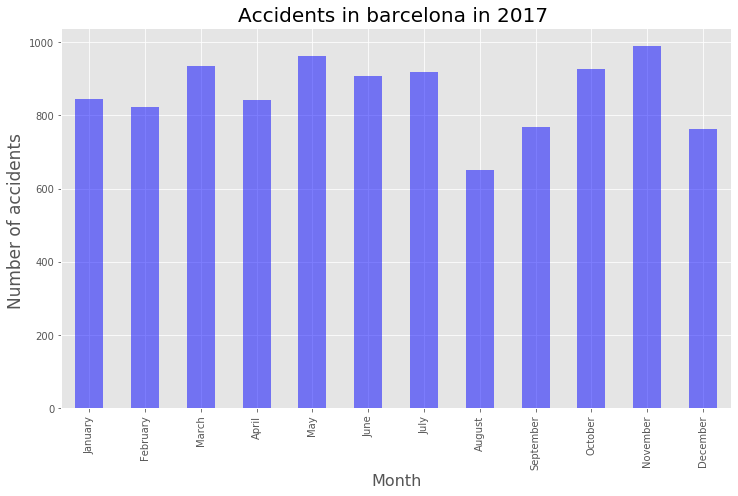

In [19]:
plt.style.use('ggplot')

#Plot accidents per month 
accidents_month.plot(kind = 'bar' , figsize=(12,7) , color = 'blue' , alpha = 0.5)

#title and x,y labels 

plt.title('Accidents in barcelona in 2017 ' , fontsize = 20)
plt.xlabel('Month' , fontsize = 16)
plt.ylabel('Number of accidents ' , fontsize = 17)

# Distribution of car accidents per day of the week

Text(0, 0.5, 'Number of accidents')

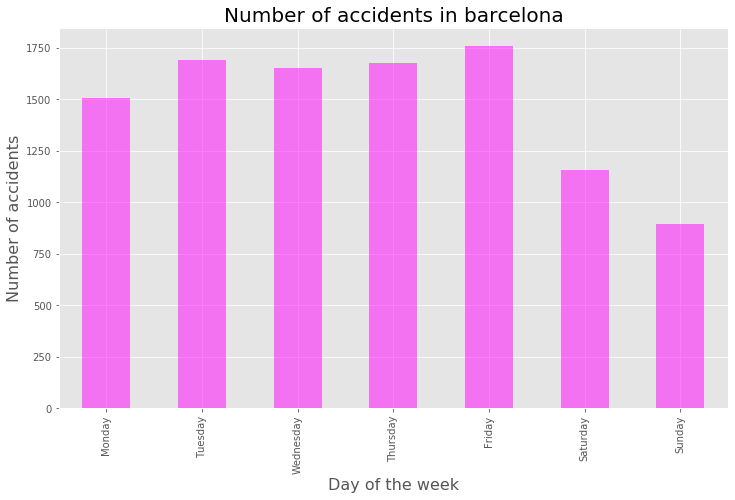

In [20]:
#Number of accidents per day of the week 
accidents_day = df.groupby(df['date'].dt.dayofweek).count().date

#Replace the day integers by day name 
accidents_day.index = [calendar.day_name[x] for x in range(0,7)]

#Plot accidents per day 
accidents_day.plot(kind = 'bar',figsize=(12,7),color = 'magenta',alpha = 0.5)

#Title and x,y labels 
plt.title("Number of accidents in barcelona" , fontsize = 20)
plt.xlabel("Day of the week" , fontsize = 16)
plt.ylabel("Number of accidents" , fontsize = 16)

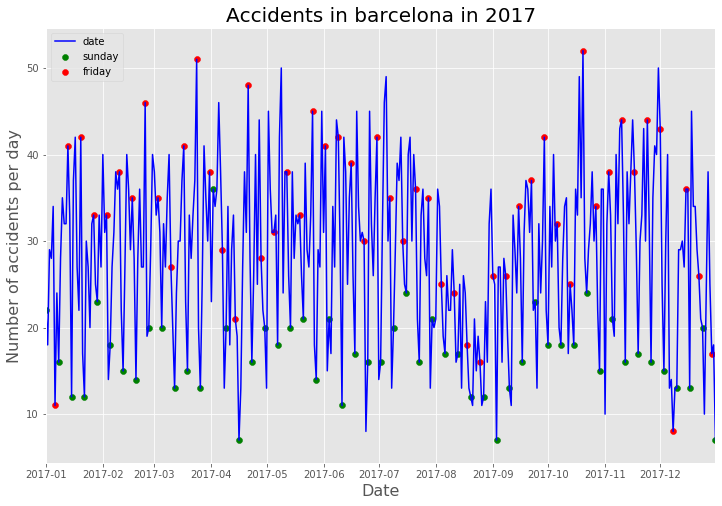

In [21]:
accidents = df.groupby(df['date'].dt.date).count().date

accidents.plot(figsize=(12,8) , color = 'blue')


#Sunday Accidents 
sundays = df.groupby(df[df['date'].dt.dayofweek == 6].date.dt.date).count().date
plt.scatter(sundays.index,sundays,color = 'green' , label = 'sunday')

#Friday Accidents 
fridays = df.groupby(df[df['date'].dt.dayofweek == 4].date.dt.date).count().date
plt.scatter(fridays.index , fridays , color ='red' , label = 'friday')

#Title , X & Y label 
plt.title("Accidents in barcelona in 2017" , fontsize = 20)
plt.xlabel('Date' , fontsize = 16)
plt.ylabel('Number of accidents per day' , fontsize = 16)
plt.legend()

# Distribution of car accidents per hour

Text(0, 0.5, 'Number of accidents')

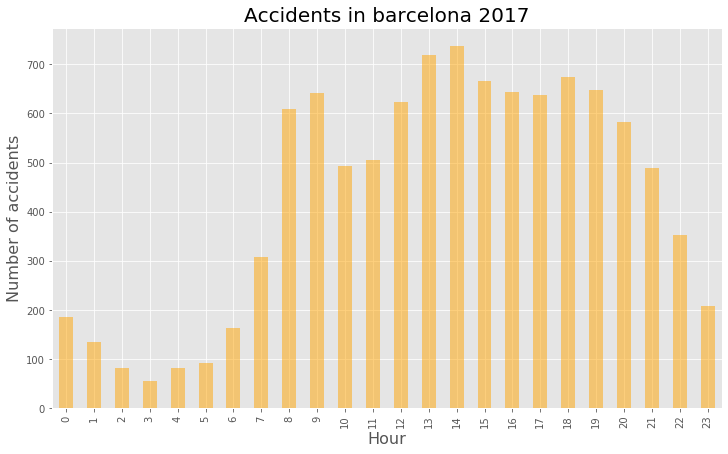

In [22]:
#Number of accidents per hour 
accidents_hour = df.groupby(df['date'].dt.hour).count().date

#Plot accidents 
accidents_hour.plot(kind = 'bar' , figsize=(12,7) , color = 'orange' , alpha = 0.5)

#title and x,y lables 
plt.title('Accidents in barcelona 2017' , fontsize = 20)
plt.xlabel('Hour' , fontsize = 16)
plt.ylabel('Number of accidents' , fontsize  = 16)

# Distribution of car accidents per day of the week and hour

Text(0, 0.5, 'Hour')

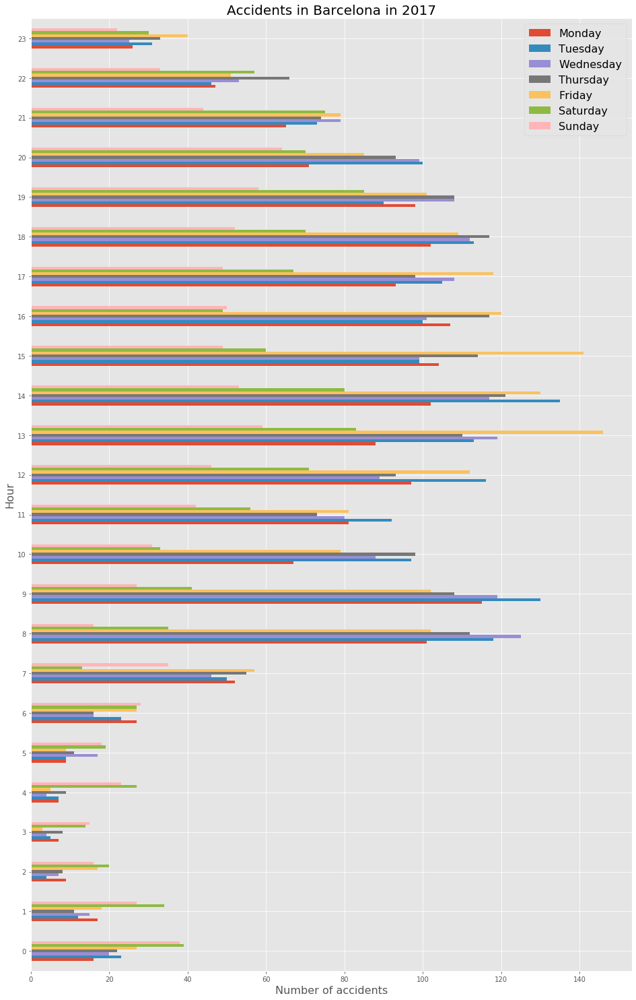

In [23]:
#Number of accidents per hour and day 

accidents_hour_day = df.groupby([df['date'].dt.hour.rename('hour'), df['date'].dt.dayofweek.rename('day')]).count().date 

accidents_hour_day.unstack().plot(kind = 'barh' , figsize=(16,26))

# title and x,y labels
plt.legend(labels= [calendar.day_name[x] for x in range(0,7)] , fontsize = 16)
plt.title('Accidents in Barcelona in 2017',fontsize=20)
plt.xlabel('Number of accidents',fontsize=16)
plt.ylabel('Hour',fontsize=16)

Vehicles involved

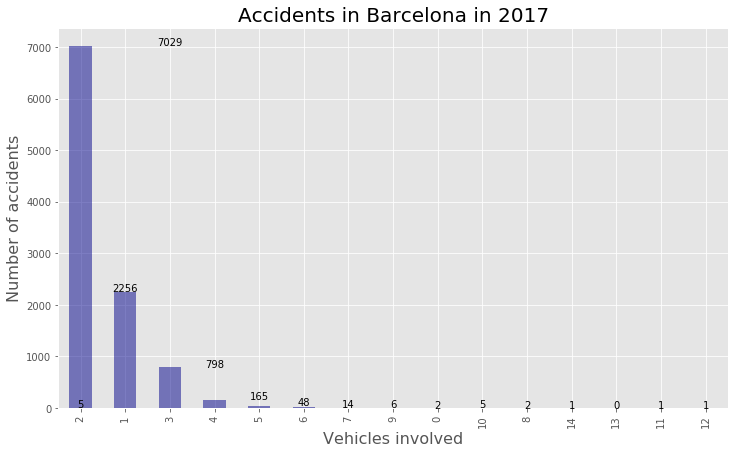

In [24]:
#Compute the number of accidents to the number of vehicles involved 
vehicles_involved = df.vehicles_involved.value_counts()


#There is no car accident involved We include 0 in our Series for better visualization
vehicles_involved[12] = 0

#Plot the numebr of car accidents to the number of vehicles involved 
vehicles_involved.plot(kind = 'bar' , figsize=(12,7) , color= 'darkblue' , alpha = 0.5)

# Title and x,y labels
plt.title('Accidents in Barcelona in 2017',fontsize=20)
plt.xlabel('Vehicles involved',fontsize=16)
plt.ylabel('Number of accidents',fontsize=16);

#print a label above each bar indicating number of accidents 
for index in vehicles_involved.index:
    plt.text(x = index , y = vehicles_involved.loc[index], s = str(vehicles_involved.loc[index]),horizontalalignment = 'center')

Text(0, 0.5, '')

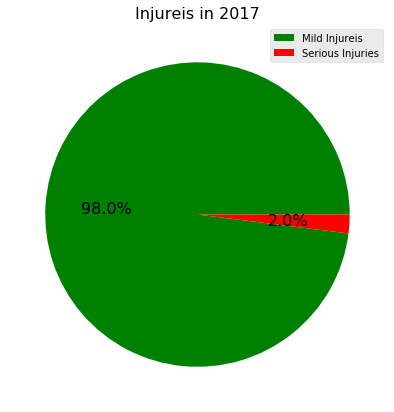

In [25]:
#Series with the number of mild and serious injuries 
injuries =  df[['mild_injuries' , 'serious_injuries']].sum()

#Pie plot with the percentage of victims with mild and serious injuries 
injuries.plot(kind = 'pie',figsize=(7,7),colors=['green', 'red'],labels = None,autopct = '%1.1f%%',fontsize = 16)

#Legend and title
plt.legend(labels = ['Mild Injureis' , 'Serious Injuries'])
plt.title('Injureis in 2017' , fontsize = 16)
plt.ylabel('')

([<matplotlib.axis.XTick at 0x1e7c214a630>,
 <a list of 7 Text xticklabel objects>)

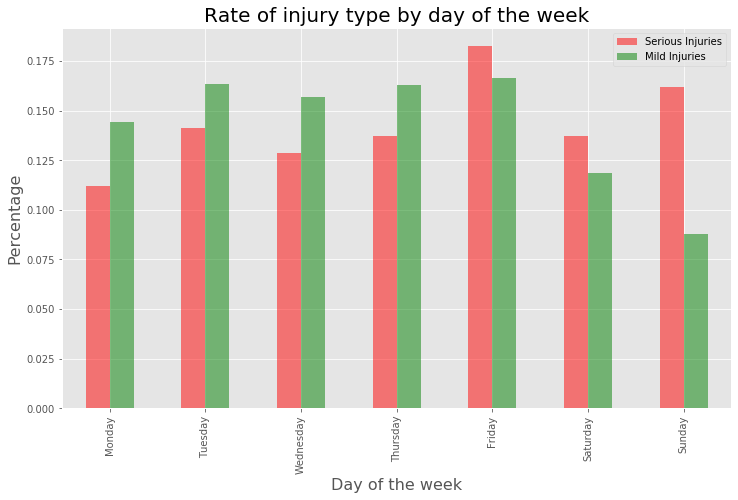

In [26]:
#Number of serious injuries per day of the week 
accident_serious = df[df['serious_injuries']!= 0].groupby(df['date'].dt.dayofweek).sum().serious_injuries

#Percentage of the serious injuries per day of the week
rate_serious = accident_serious/accident_serious.sum()

#Number of mild injuries per day of the week 
accidents_mild = df[df['mild_injuries']!=0].groupby(df['date'].dt.dayofweek).sum().mild_injuries

#Percentage of the mild injuries per day of the week
rate_mild = accidents_mild/accidents_mild.sum()

#Combine both series and dataframe to plot them as side by side bar
rates = pd.DataFrame({'Serious Injuries': rate_serious , 'Mild Injuries' : rate_mild})
rates.plot(kind='bar', figsize=(12,7), color=['red','green'] , alpha = 0.5)

#Titles and labels 
plt.title('Rate of injury type by day of the week' , fontsize = 20)
plt.xlabel('Day of the week' , fontsize = 16)
plt.ylabel('Percentage' , fontsize = 16)
plt.xticks(np.arange(7) , [calendar.day_name[x] for x in range(0,7)])

In [27]:
#Define a map centered around barcelona 
barcelona_map = folium.Map(location=[41.38879,2.15899] ,zoom_start = 12)

#Display the map
barcelona_map

In [28]:
#Create a map object of the city of barcelona 
barcelona_map = folium.Map(location=[41.38879, 2.15899],zoom_start = 12)

#Display the accidents where only serious injuries have occured 
for lat,lng,label in zip(df.latitude,df.longitude,df.serious_injuries.astype(str)):
    if label != 0 :
        folium.CircleMarker(
        [lat,lng],
        radius = 3,
        color = 'red',
        fill = True,
        popup = label,
        fill_color = 'darkred',
        fill_opacity = 0.9
        ).add_to(barcelona_map)
        
#Show map
barcelona_map

In [29]:
#Create the map object of the city of barcelona 
barcelona_map = folium.Map(location = [41.38879, 2.15899],zoom_start = 12)

#Instantiate a mark cluster object for hte car accidents 
accidents = plugins.MarkerCluster().add_to(barcelona_map)


#Display only accidents where serious injuries occured 
for lat,lng,label in zip(df.latitude,df.longitude , df.serious_injuries.astype(str)):
    if label!= '0':
        folium.Marker(
        location = [lat,lng] , 
        icon = None, 
        popup = label).add_to(accidents)
        
#Display Map
barcelona_map

In [30]:
#Create a map object of the city of barcelona
barcelona_map = folium.Map(location=[41.38879, 2.15899], zoom_start=12)

#Nested list that contains the latitude and longitude of different accidents 
hours_list = [[] for _ in range(24)]
for lat,lng,hour in zip(df.latitude,df.longitude,df.date.dt.hour):
    hours_list[hour].append([lat,lng])
    
#Labels indicating the hours 
index = [str(i) + ' Hours' for i in range(24)]

#Instantiate a heatmap with timeobject for the car accidents 
HeatMapWithTime(hours_list,index).add_to(barcelona_map)

#Display the map
barcelona_map